<a href="https://colab.research.google.com/github/dataML007/NLP-Project/blob/master/Final_Project_NLP_V2_0502.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Course**: SP20-BL-INFO-I590-32961

**Professor**: Olga B. Scrivner

**Student's**: 
Anantha Janakiraman ,
Balaji Dhamodaran ,
Srimannarayana Pullakhandam

#Introduction#

###Objective###
COVID-19 can affect anyone, and the disease can cause symptoms ranging from mild to very severe.  For some other illnesses caused by respiratory viruses (such as influenza), some people may be more likely to have severe illness than others because they have characteristics or medical conditions that increase their risk. These are commonly called “risk factors.” Our objective in this study is to understand and assess the risk factors surrounding the COVID-19 disease.

###Why Risk Factors Matter?###
People with risk factors may be more likely to need hospitalization or intensive care if they have COVID-19, or they may be more likely to die of the infection. It is important to learn about risk factors for severe COVID-19 illness because it can help us:

- Take extra precautions to avoid exposure to the virus that causes COVID-19.
- Better understand how a medical condition could affect our own health if any of us get sick with COVID-19.
- Anticipate medical treatment that we might need if we get sick.
- Reduce the risk for severe COVID-19 illness by managing any conditions we have that are risk factors.

###How We Learn about Risk Factors for Severe Disease?###

Because COVID-19 is a new disease, more work is needed to better understand the risk factors for severe illness or complications. Potential risk factors that have been identified to date include:

- Age
- Race/ethnicity
- Gender
- Some medical conditions
- Use of certain medications
- Poverty and crowding
- Certain occupations
- Pregnancy
- Additional research will help us confirm if these are risk factors for severe COVID-19 illness and determine if there are other factors that increase a person’s risk.

#Problem Definition#

###What do we know already?###

- Data on potential risks factors
  - Smoking, pre-existing pulmonary disease
  - Co-infections (determine whether co-existing respiratory/viral infections make the virus more transmissible or virulent) and other co-morbidities
  - Neonates and pregnant women
  - Socio-economic and behavioral factors to understand the economic impact of the virus and whether there were differences.
- Transmission dynamics of the virus, including the basic reproductive number, incubation period, serial interval, modes of transmission and environmental factors
- Severity of disease, including risk of fatality among symptomatic hospitalized patients, and high-risk patient groups
- Susceptibility of populations
- Public health mitigation measures that could be effective for control

###What are we trying to solve in this study?###

When a new virus is discovered and causes a pandemic, it is important for scientists to get information coming from all scientific sources that may help them combat the pandemic. The challenege, however, is that the number of scientific papers created is large and the papers are published very rapidly, making it nearly impossible for scientists to digest and understand important data in such a huge collection  of data.

The goal of this study is to explore different NLP and Machine Learning techniques to group related or similar articles from the large collection of articles in the dataset provided.

#Data Description#

The objective of the study is to group related articles from the collection to help identify the potential risk for factors for COVID-19. The study explores different modeling techniques for such a setting to group or cluster similar articles using a set of features given the basic assumption that the  articles related to coronaviruses, associated risks and therapeutic approaches. There are multiple risk factors associated with the disease and as already stated the objective is to identify  related articles and understand the associated risk factors based on the groupings and it is important to compare the performance of different NLP/machine learning approaches consistently.

In response to the COVID-19 pandemic, the White House and a coalition of leading research groups have prepared the COVID-19 Open Research Dataset (CORD-19). CORD-19 is a resource of over 59,000 scholarly articles, including over 47,000 with full text, about COVID-19, SARS-CoV-2, and related coronaviruses. The metadata file contains about 51078 entries and about 6 features including source, title, doi, publish time, abstract, authors and there are above 42,000 articles with abstract. This freely available dataset is provided to the global research community to apply recent advances in natural language processing and other AI techniques to generate new insights in support of the ongoing fight against this infectious disease. There is a growing urgency for these approaches because of the rapid acceleration in new coronavirus literature, making it difficult for the medical research community to keep up.

#####<b>Statistics on the Metadata Dataset:</b>#####

 |  Column      | Non Missing | Missing
 |  ------      | ----------- | -------
 |  source_x    |   51078 | 0
 |  title       |   50920 | 158
 |  doi         |   47741 | 3337
 |  abstract    |   42352 | 8726
 |  publish_time|   51070 | 8
 |  authors     |   48891 | 2187

#####<b>Statistics on the Full Dataset:</b>#####

|Source			|File Type	|Count of Articles|
|-------------------	|---------	|------------------|
|biorxiv_medrxiv	|PDF		|1625|
|comm_use_subset	|PDF		|9524|
|comm_use_subset	|PMC		|9148|
|custom_license		|PDF		|26505|
|custom_license		|PMC		|7802|
|noncomm_use_subset	|PDF		|2490|
|noncomm_use_subset	|PMC		|2217|

We may not be using some of the attributes like the title, doi, publish time and authors that seem to have low significance for the problem we are trying to solve specifically during model training and evaluation because they are more informational and do not offer statistical significance. These attributes will be dropped during the data pre-processing phase. 

Considering the size of the full dataset, the study uses the approach of evaluating different models using a sub sampled (20%) dataset and based on the understanding of the outcome from the model trained on the sub-sampled dataset, a more deeper or multi-layered  model will be trained and evaluated with the full dataset. First steps would be cleaning and pre-processing of the data before training the model and the initial training/evaluation would be done using basic parameter settings and upon observing the outcome of this initial model, we will  conduct further experimentation to adjust the settings of the multi-layered model to obtain groupings with high coherence from the collection and if needed engineer additional features from the provided input data to improve the quality of clustering/grouping.

Data can be found at: https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge

#Model Development Pipeline#

Here is a visual representation of the perceived model pipeline including the different phases of data preparation and data analysis. The visualization provides a brief description of the sub-tasks that should be conducted in each of the individual phases leading up to operationalization of the final optimized model in Production. The visualization serves as a blue print for the forthcoming sections.

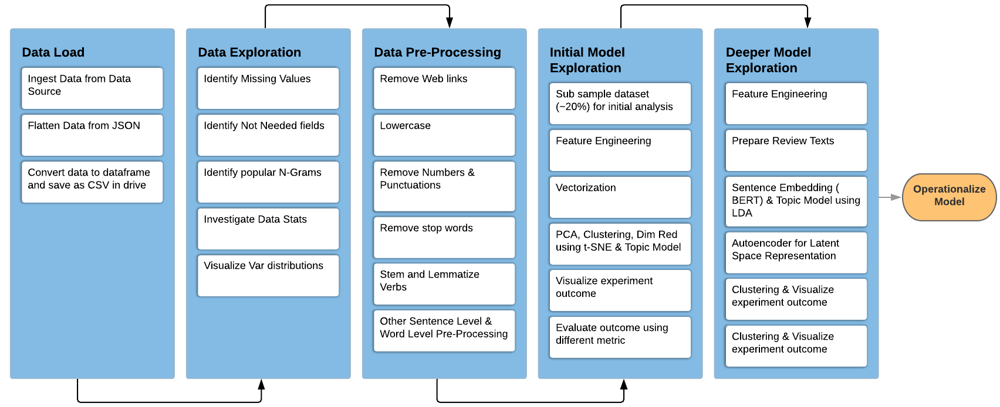

In [0]:
from IPython.display import Image
Image(filename='/content/drive/My Drive/Model_Flow_Pic.png')

# Import Libraries

In [0]:
import os
import re

import json
import math
import glob
import time

import string
import random
import pickle

import functools
import collections

from tqdm import tqdm
from PIL import Image
import seaborn as sns

from nltk import PorterStemmer
import torch.nn.functional as F
import itertools
from textblob import TextBlob

import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')


from nltk.corpus import stopwords 
from nltk.corpus import wordnet
import time

# from pyecharts.charts import Graph
# from pyecharts import options as opts
from keras.preprocessing import sequence
from scipy.spatial.distance import cdist
from nltk.corpus import stopwords 
from nltk.corpus import wordnet
from IPython.core.display import display, HTML

from nltk.tokenize import word_tokenize, sent_tokenize
from torch.utils.data import Dataset,TensorDataset,DataLoader

from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.stem import LancasterStemmer, PorterStemmer, SnowballStemmer, WordNetLemmatizer


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


**More Packages & version check**

In [0]:
# check version 
import sys #access to system parameters https://docs.python.org/3/library/sys.html
print("Python version: {}". format(sys.version))

import pandas as pd #collection of functions for data processing and analysis modeled after R dataframes with SQL like features
print("pandas version: {}". format(pd.__version__))

import matplotlib #collection of functions for scientific and publication-ready visualization
print("matplotlib version: {}". format(matplotlib.__version__))
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import numpy as np #foundational package for scientific computing
print("NumPy version: {}". format(np.__version__))

import scipy as sp #collection of functions for scientific computing and advance mathematics
print("SciPy version: {}". format(sp.__version__)) 

import IPython
from IPython import display #pretty printing of dataframes in Jupyter notebook
print("IPython version: {}". format(IPython.__version__)) 

import sklearn #collection of machine learning algorithms
print("scikit-learn version: {}". format(sklearn.__version__))

import tensorflow as tf
print("tensorflow version: {}". format(tf.__version__))

import torch #collection of machine learning algorithms
print("torch version: {}". format(torch.__version__))


# ignore warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
print('-'*71)


from subprocess import check_output

Python version: 3.6.9 (default, Nov  7 2019, 10:44:02) 
[GCC 8.3.0]
pandas version: 1.0.3
matplotlib version: 3.2.1
NumPy version: 1.18.3
SciPy version: 1.4.1
IPython version: 5.5.0
scikit-learn version: 0.22.2.post1
tensorflow version: 2.2.0-rc3
torch version: 1.5.0+cu101
-----------------------------------------------------------------------


**GPU and TPU**

In [0]:
## try to use the tpu of Kaggle
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
AUTO = tf.data.experimental.AUTOTUNE
# Detect hardware, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection. No parameters necessary if TPU_NAME environment variable is set. On Kaggle this is always the case.
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() # default distribution strategy in Tensorflow. Works on CPU and single GPU.
print("REPLICAS: ", strategy.num_replicas_in_sync)

Tensorflow version 2.2.0-rc3
REPLICAS:  1


In [0]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

**Install packages**

In [0]:
pip install iso3166

# Data Ingestion

**Mount Google Drive**

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


**Authenticate GCS Bucket & set config**

In [0]:
from google.colab import auth
auth.authenticate_user()
project_id = 'test-214423'
!gcloud config set project {project_id}
!gsutil ls

Updated property [core/project].
gs://artifacts.test-214423.appspot.com/
gs://asia-northeast1-my-comp-env-8c83afcc-bucket/
gs://my-test-bucket-214423/
gs://us-central1-composer-test-aa9326fe-bucket/
gs://us-central1-my-composer-env-138aae89-bucket/


**Copy from GCS bucket to Google Drive**

In [0]:
bucket_name = 'my-test-bucket-214423'
!gsutil -m cp -r  gs://{bucket_name}/ /content/drive/My\ Drive/Data/

Streaming output truncated to the last 5000 lines.
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123610.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123611.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123612.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123615.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123619.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123622.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/custom_license/pmc_json/PMC7123625.xml.json...
Copying gs://my-test-bucket-214423/CORD-19-research-challenge/custom_license/cust

**Prepare the Data**

In [0]:
!ls /content/drive/My\ Drive/CORD-19-research-challenge/  # the content of input files
root_path = '/content/drive/My\ Drive/CORD-19-research-challenge/'
metadata_path = f'{root_path}/metadata.csv'  

biorxiv_medrxiv			      json_schema.txt
comm_use_subset			      metadata.csv
cord19_specter_embeddings_2020-04-10  metadata.readme
COVID.DATA.LIC.AGMT.pdf		      noncomm_use_subset
custom_license


In [0]:
import pandas as pd
## load the meta data from the CSV file 
df = pd.read_csv('/content/drive/My Drive/CORD-19-research-challenge/metadata.csv',header = 0,  # you can specify the header where it is from
                 usecols=['title','abstract','authors','doi','publish_time','source_x'],   # select use columns
                 dtype={
                        'Microsoft Academic Paper ID': str,
                        'pubmed_id': str,
                        'doi': str,                       
                       },
                 low_memory=False)

print (f'The shape of the input data:\n{df.shape[0]} articles, every article has {df.shape[1]} features')
print(df.info())
print(f'None data:\n{df.isnull().sum()}')
df.sample(3)

# before 2020, maybe publication about COVID-2019 is not out.
df_2020 = df.query("'2020' in publish_time")

# I think Confidence Interval (CI) is used epidemiological evaluation
df_2020_ci = df_2020.loc[df_2020["abstract"].str.contains("CI").fillna(False), :]

print(df_2020_ci.shape)
df_2020_ci.head()

The shape of the input data:
51078 articles, every article has 6 features
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51078 entries, 0 to 51077
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   source_x      51078 non-null  object
 1   title         50920 non-null  object
 2   doi           47741 non-null  object
 3   abstract      42352 non-null  object
 4   publish_time  51070 non-null  object
 5   authors       48891 non-null  object
dtypes: object(6)
memory usage: 2.3+ MB
None
None data:
source_x           0
title            158
doi             3337
abstract        8726
publish_time       8
authors         2187
dtype: int64
(17, 6)


,source_x,title,doi,abstract,publish_time,authors
26194,CZI,Backcalculating the Incidence of Infection wit...,10.3390/jcm9030657,To understand the time-dependent risk of infec...,2020,"Nishiura, Hiroshi"
26218,CZI,Analysis of factors associated with disease ou...,10.1097/cm9.0000000000000775,"BACKGROUND: Since early December 2019, the 201...",2020,"Liu, Wei; Tao, Zhao-Wu; Lei, Wang; Ming-Li, Yu..."
26446,WHO,[Analysis of myocardial injury in patients wit...,10.3760/cma.j.cn112148-20200225-00123,Objective: To evaluate the cardiovascular dama...,2020,"Chen, C.; Yan, J. T.; Zhou, N.; Zhao, J. P.; W..."
26470,WHO,Study on assessing early epidemiological param...,10.3760/cma.j.cn112338-20200205-00069,Objective: To study the early dynamics of the ...,2020,"Song, Q. Q.; Zhao, H.; Fang, L. Q.; Liu, W.; Z..."
26472,WHO,Estimating the basic reproduction number of CO...,10.3760/cma.j.cn112338-20200210-00086,Objective: The number of confirmed and suspect...,2020,"Wang, Y.; You, X. Y.; Wang, Y. J.; Peng, L. P...."


In [0]:
import os
biorxiv_dir = '/content/drive/My Drive/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/'
filenames = os.listdir(biorxiv_dir)
print("Number of articles retrieved from biorxiv:", len(filenames))

Number of articles retrieved from biorxiv: 1


**The Big Merge and final CSV**

In [0]:
# load the json file in the directory
dirs_=["/content/drive/My Drive/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/pdf_json",
"/content/drive/My Drive/CORD-19-research-challenge/comm_use_subset/comm_use_subset/pdf_json",
"/content/drive/My Drive/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/pdf_json",
"/content/drive/My Drive/CORD-19-research-challenge/custom_license/custom_license/pdf_json"]
 

data_ = list()
for dir_ in dirs_:
	for filename in tqdm(os.listdir(dir_)):

		x=str(dir_)+'/'+str(filename)
        
		with open(x) as file:
			data=json.loads(file.read())
		
		#take out the data from the json format
		paper_id=data['paper_id']
		meta_data=data['metadata']
		abstract=data['abstract']
		abstract_text=""
		for text in abstract:
			abstract_text+=text['text']+" "
		body_text=data['body_text']
		full_text=""
		for text in body_text:
			full_text+=text['text']+" "
		back_matter=data['back_matter']
		#store everything to a dataframe
		data_.append([paper_id,abstract_text,full_text])

df_json = pd.DataFrame(data_,columns=['paper_id','abstract','full_text'])
print(df.head())
#save as a csv
#df.to_csv('biorxiv_medrxiv.csv', index = True)
df_json.to_csv('train.csv', index = True)
#a data frame for my complete body.

100%|██████████| 26505/26505 [5:38:06<00:00,  1.31it/s]


  source_x  ...                                            authors
0      PMC  ...  Myatt, Theodore A; Johnston, Sebastian L; Rudn...
1      PMC  ...                                   Disotell, Todd R
2      PMC  ...                                  Petsko, Gregory A
3      PMC  ...  Lin, Marie; Tseng, Hsiang-Kuang; Trejaut, Jean...
4      PMC  ...  Ng, Tuen Wai; Turinici, Gabriel; Danchin, Antoine

[5 rows x 6 columns]


In [0]:
%%time
train_data = pd.read_csv(drive_path + 'train.csv')

CPU times: user 9.93 s, sys: 1.31 s, total: 11.2 s
Wall time: 11.9 s


**** Run these cells only if the runtime disconnects ****

In [0]:
df_json = pd.read_csv('/content/drive/My Drive/train.csv')

In [0]:
df = pd.read_csv('/content/drive/My Drive/Metadata.csv')

**Total Number of Articles with Abstract**

In [0]:
print("The number of articles with abstract: " + str(sum(df["abstract"].notnull())))

The number of articles with abstract: 42352


#Data Exploration#

Data Exploration was performed on the dataset to understand the charecteristics of the data and visualize the data, so the patters on the data can be well undersood. In that process, one of the first step we performed was to do a "Word Cloud" Analysis. 

Removing the most common stopwords and visualized the wordcloud tags such as "Transmissible", "pathogens","Resp Puloma" were identifed as the most commonly mentioned words on the wordcloud

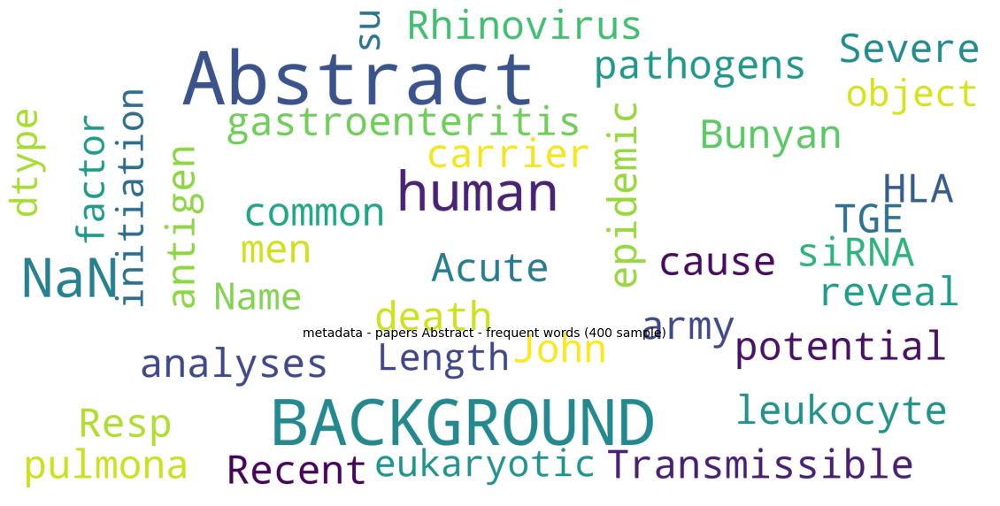

In [0]:
from wordcloud import WordCloud, STOPWORDS
from tqdm import tqdm_notebook

stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
   """
    Function for getting wordcoud.
    Input:
        param data: a string contains the text that needs to be in Word Cloud
        param title: a title for the wordcloud 
    Output:
        Show the 
    """
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=30, 
        scale=5,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(20,5))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=14)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
    
show_wordcloud(df['abstract'], title = 'metadata - papers Abstract - frequent words (200 sample)')

**Publish Year Distribution**

The chart below shows the distribution plot for Year vs  Frequency of the publications. It can be noticed that around the year 2020, there is a spike in the number of articles published after the year 2015 and above.

Text(0, 0.5, 'Frequency')

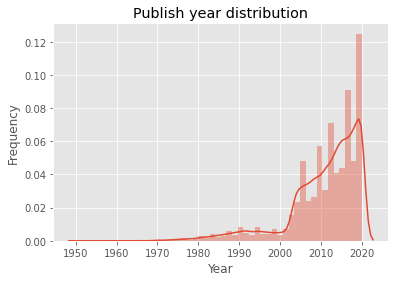

In [0]:
## Distribution plot for Published Articles, Year vs Frquency
year = []
for y in df["publish_time"][df["publish_time"].notnull()]:
    year.append(int(re.split(' |-', y)[0]))

sns.distplot(year, bins = 50)
plt.title("Publish year distribution")
plt.xlabel("Year")
plt.ylabel("Frequency")

**Literature source distribution**

We created a pie chart to understand the source of the dataset. From the below Pie-Chart it can noticed that the largest contributors are "PMC" and "Elsevier"

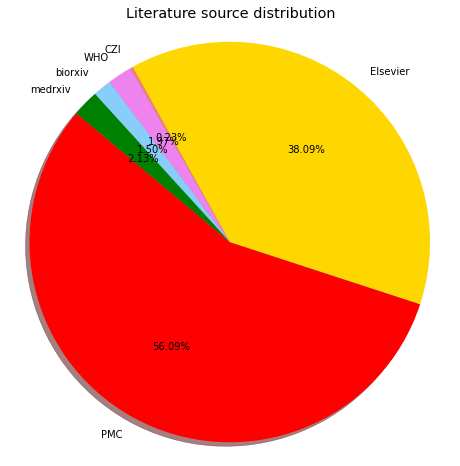

In [0]:
#Create a Pie chart of Source_x
sourceDic = collections.defaultdict(int)
for s in df["source_x"][df["source_x"].notnull()]:
    sourceDic[s] += 1
sizes, explode, labels = [], [], []
for s in sourceDic:
    sizes.append(sourceDic[s])
    explode.append(0)
    labels.append(s)
    
colors = ['red', 'gold', 'lightcoral', 'violet', 'lightskyblue', 'green']
fig = plt.gcf()
fig.set_size_inches(8, 8)
plt.pie(sizes, explode=explode, labels=labels, colors = colors, autopct='%1.2f%%', shadow=True, startangle=140)
plt.title('Literature source distribution')
plt.axis('equal')
plt.show()

**Abstract Word Count after Pre-Processing**

Performed pre-processing of the df["abstract"] field to cleanup the data as follows: 1. Remove Web Links, 2. Remove Punctuation, 3. Lower Case, 4. Remove Numbers, 5. Tokenize the data, 6. Remove Stop words, 7. Obtain the Stem and 8. Lemmatize the data. After performing the above steps obtain the frequency count of words present in df["abstract"] field 

In [0]:
startTime = time.time()
absLength = []
word2count = {}
for abstract in df["abstract"][df["abstract"].notnull()]:
    ## Remove web links
    abstract = re.sub('https?://\S+|www\.\S+', '', abstract) 

    ## Lowercase
    abstract = abstract.lower()
    
    ## Remove punctuation
    abstract = re.sub('<.*?>+', ' ', abstract)
    abstract = re.sub('[%s]' % re.escape(string.punctuation), ' ', abstract)
    
    ## Remove number
    abstract = re.sub(r'\d+', '', abstract)
    
    ## Tokenize
    words = word_tokenize(abstract)
    
    ## Remove stop words
    nltk_stop_words = stopwords.words('english')
    words = [word for word in words if word not in nltk_stop_words]
    
    ## Stem
    stemmer = SnowballStemmer('english')
    words = [stemmer.stem(word) for word in words]
    
    ## Lematize verbs
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word, pos='v') for word in words]
    
    ## Record length
    absLength.append(len(words))
    
    ## Get word count
    for word in words:
        count = word2count.get(word, 0)
        word2count[word] = count + 1
print("Time spent: " + str(round((time.time() - startTime) / 60, 3)) + "min.")
print("The number of tokens: " + str(len(word2count)))

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
Time spent: 2.633min.
The number of tokens: 75938


**Abstract Token Distribution after Pre-Processing**

Frequency distribution of Abstract Token count is shown below. There is approzimately 20 extremely long abstracts from the dataset. 

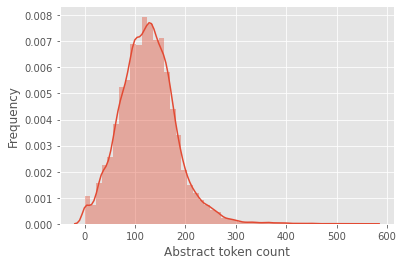

In [0]:
#Distribution plot for Abstract Token Count
sns.distplot(sorted(absLength)[:-20], bins = 50) # There are 20 extremely long abstracts
plt.xlabel("Abstract token count")
plt.ylabel("Frequency")
plt.show()

**Top 50 Unigrams from Abstract before Stop Word Removal**

We visualized the top 50 Unigrams from the abstract before the Stop Word Removal and identifed words such as "the","of" "and" were top unigrams

In [0]:
# Get "abstract" frpom the dataset and create a collection of the counts
abstracts = df[df['abstract'].notnull()]['abstract']
words_in_abstract = [abstract.lower().split() for abstract in abstracts]
all_words_abstract = list(itertools.chain(*words_in_abstract))
# Create counter
counts_abstract = collections.Counter(all_words_abstract)

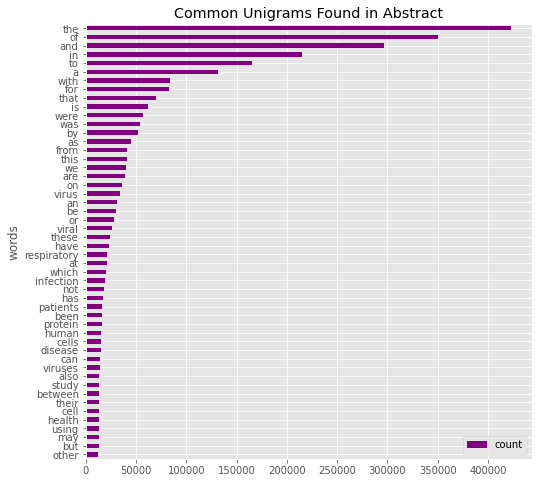

In [0]:
# convert the abstract to a DataFrame
clean_abstract = pd.DataFrame(counts_abstract.most_common(50),
                             columns=['words', 'count'])
fig, ax = plt.subplots(figsize=(8, 8))
# Plot horizontal bar graph
clean_abstract.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="purple")
ax.set_title("Common Unigrams Found in Abstract")
plt.show()

**Top 50 Unigrams from Abstract after Stop Word Removal**

We removed the stop words and created the abstract count again and created a horizontal bar chart and identified that the top words are more related to the dataset such as "virus", "viral", "respiratory","infection" etc

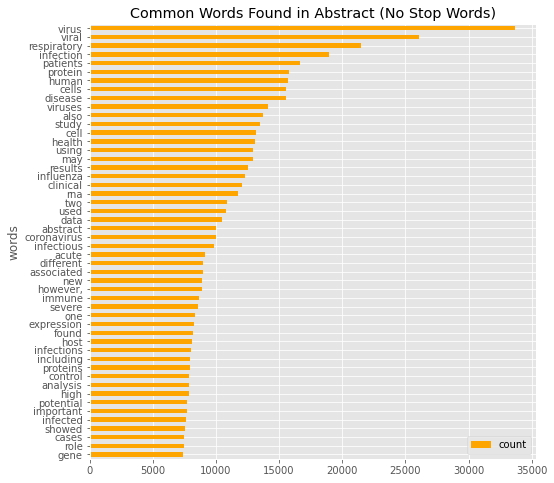

In [0]:
# obtain the list of stop words
stop_words = set(stopwords.words('english'))
# View a few words from the set
list(stop_words)[0:10]

#create tje abstract words counter without the stop words
abstract_nsw = [[word for word in abstract_words if not word in stop_words]
              for abstract_words in words_in_abstract]
all_words_nsw = list(itertools.chain(*abstract_nsw))
counts_nsw = collections.Counter(all_words_nsw)

clean_abstract_nsw = pd.DataFrame(counts_nsw.most_common(50),
                             columns=['words', 'count'])
fig, ax = plt.subplots(figsize=(8, 8))
# Plot horizontal bar graph
clean_abstract_nsw.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="orange")
ax.set_title("Common Words Found in Abstract (No Stop Words)")
plt.show()

**Top 50 Bigrams from Abstract before Stop Word Removal**

We visualized the top 50 Bigrams from the abstract before the Stop Word Removal and identifed bigrams such as "and in","severe acute" "use of" were top bigrams and didnt make much sense. 

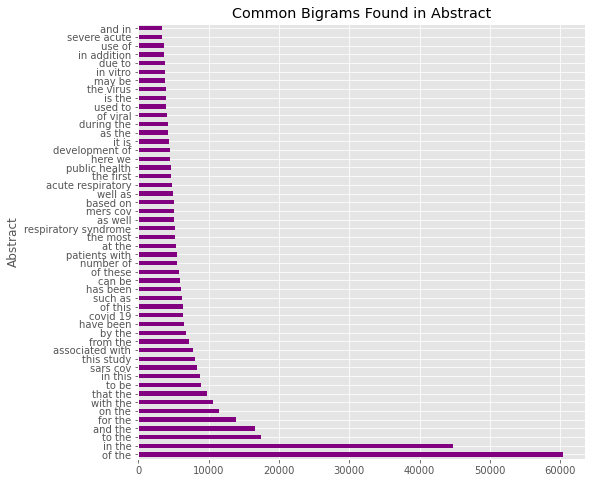

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
# Function to get top n bigrams
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(abstracts, 50)

df3 = pd.DataFrame(common_words, columns = ['Abstract' , 'Count'])
fig, ax = plt.subplots(figsize=(8, 8))
df3.groupby('Abstract').sum()['Count'].sort_values(ascending=False).plot.barh(x='Abstract',
                      y='Count',
                      ax=ax,
                      color="purple")
ax.set_title("Common Bigrams Found in Abstract")
plt.show()

**Top 50 Bigrams from Abstract After Stop Word Removal**

We removed the stop words and created the abstract count again and created a horizontal bar chart and identified that the top words are more related to the dataset such as "host cell", "respiratory infections", "nucleic acid"etc

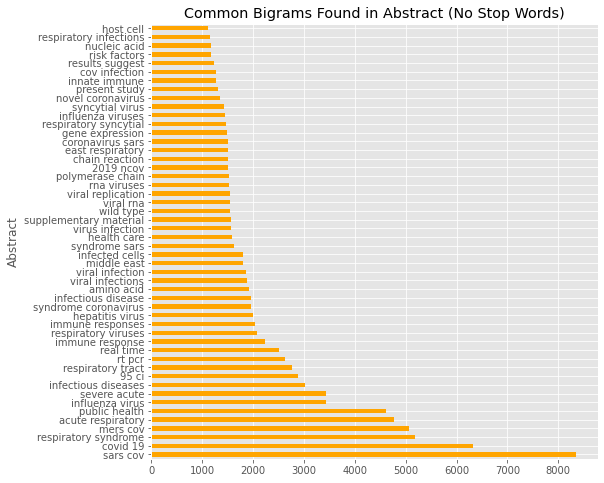

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(abstracts, 50)
#for word, freq in common_words:
#    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['Abstract' , 'Count'])
fig, ax = plt.subplots(figsize=(8, 8))
df3.groupby('Abstract').sum()['Count'].sort_values(ascending=False).plot.barh(x='Abstract',
                      y='Count',
                      ax=ax,
                      color="orange")
ax.set_title("Common Bigrams Found in Abstract (No Stop Words)")
plt.show()

**Top 50 Trigrams from Abstract before Stop Word Removal**

We visualized the top 50 Trigrams from the abstract before the Stop Word Removal and identifed trigrams such as "the impact of","the effects of" "to investigate the" were top trigrams and didnt make much sense. 

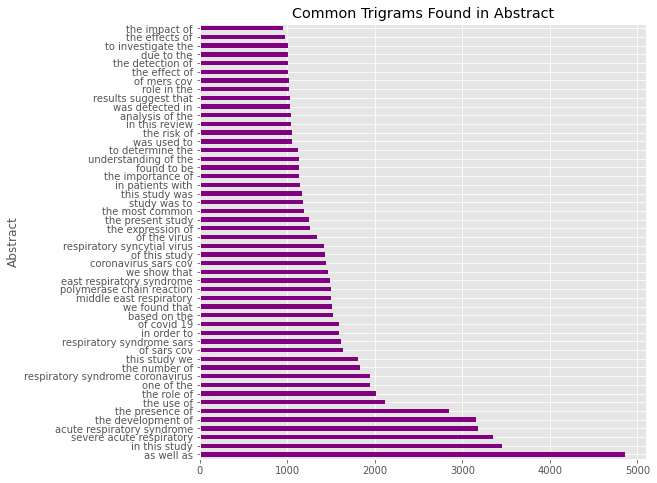

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(abstracts, 50)
#for word, freq in common_words:
#    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['Abstract' , 'Count'])
fig, ax = plt.subplots(figsize=(8, 8))
df3.groupby('Abstract').sum()['Count'].sort_values(ascending=False).plot.barh(x='Abstract',
                      y='Count',
                      ax=ax,
                      color="purple")
ax.set_title("Common Trigrams Found in Abstract")
plt.show()

**Top 50 Trigrams from Abstract after Stop Word Removal**

We removed the stop words and created the abstract count again and created a horizontal bar chart and identified that the top words are more related to the dataset such as "transmissable gastriebteritis virus", "corona virus 2019"etc

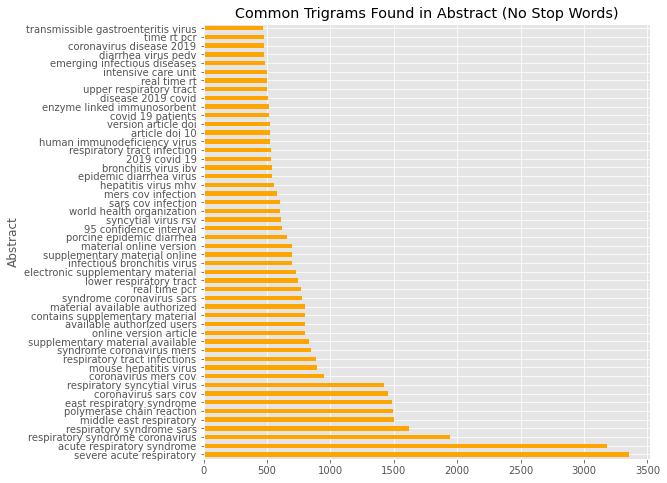

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(abstracts, 50)
#for word, freq in common_words:
#    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['Abstract' , 'Count'])
fig, ax = plt.subplots(figsize=(8, 8))
df3.groupby('Abstract').sum()['Count'].sort_values(ascending=False).plot.barh(x='Abstract',
                      y='Count',
                      ax=ax,
                      color="orange")
ax.set_title("Common Trigrams Found in Abstract (No Stop Words)")
plt.show()

**Top 50 POS Tags from Abstract**

We perrofmed a frequency count on the pos tags and identified NN and NNP are the top tags.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


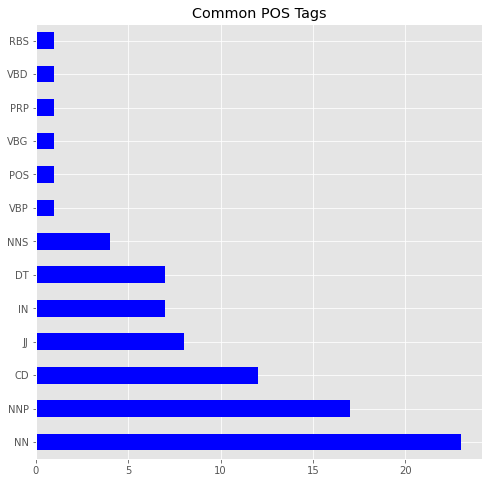

In [0]:
#function to obtain the Top 50 POS Tags
from textblob import TextBlob
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
blob = TextBlob(str(abstracts))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:50]
fig, ax = plt.subplots(figsize=(8, 8))
pos_df.plot.barh(x='pos',
            y='Count',
            ax=ax,
            color="blue")
ax.set_title("Common POS Tags")
plt.show()

We wanted to analyse the Frequency counts of Countries mentioned in the articles. 

In [0]:
# Define Country Names
CountryList = ["united states",
"afghanistan",
"albania",
"algeria",
"american samoa",
"andorra",
"angola",
"anguilla",
"antarctica",
"antigua and barbuda",
"argentina",
"armenia",
"aruba",
"australia",
"austria",
"azerbaijan",
"bahamas",
"bahrain",
"bangladesh",
"barbados",
"belarus",
"belgium",
"belize",
"benin",
"bermuda",
"bhutan",
"bolivia",
"bosnia and herzegowina",
"botswana",
"bouvet island",
"brazil",
"brunei darussalam",
"bulgaria",
"burkina faso",
"burundi",
"cambodia",
"cameroon",
"canada",
"cape verde",
"cayman islands",
"central african rep",
"chad",
"chile",
"china",
"christmas island",
"cocos islands",
"colombia",
"comoros",
"congo",
"cook islands",
"costa rica",
"cote d`ivoire",
"croatia",
"cuba",
"cyprus",
"czech republic",
"denmark",
"djibouti",
"dominica",
"dominican republic",
"east timor",
"ecuador",
"egypt",
"el salvador",
"equatorial guinea",
"eritrea",
"estonia",
"ethiopia",
"falkland islands (malvinas",
"faroe islands",
"fiji",
"finland",
"france",
"french guiana",
"french polynesia",
"french s. territories",
"gabon",
"gambia",
"georgia",
"germany",
"ghana",
"gibraltar",
"greece",
"greenland",
"grenada",
"guadeloupe",
"guam",
"guatemala",
"guinea",
"guinea-bissau",
"guyana",
"haiti",
"honduras",
"hong kong",
"hungary",
"iceland",
"india",
"indonesia",
"iran",
"iraq",
"ireland",
"israel",
"italy",
"jamaica",
"japan",
"jordan",
"kazakhstan",
"kenya",
"kiribati",
"korea (north",
"korea (south",
"kuwait",
"kyrgyzstan",
"laos",
"latvia",
"lebanon",
"lesotho",
"liberia",
"libya",
"liechtenstein",
"lithuania",
"luxembourg",
"macau",
"macedonia",
"madagascar",
"malawi",
"malaysia",
"maldives",
"mali",
"malta",
"marshall islands",
"martinique",
"mauritania",
"mauritius",
"mayotte",
"mexico",
"micronesia",
"moldova",
"monaco",
"mongolia",
"montserrat",
"morocco",
"mozambique",
"myanmar",
"namibia",
"nauru",
"nepal",
"netherlands",
"netherlands antilles",
"new caledonia",
"new zealand",
"nicaragua",
"niger",
"nigeria",
"niue",
"norfolk island",
"northern mariana islands",
"norway",
"oman",
"pakistan",
"palau",
"panama",
"papua new guinea",
"paraguay",
"peru",
"philippines",
"pitcairn",
"poland",
"portugal",
"puerto rico",
"qatar",
"reunion",
"romania",
"russian federation",
"rwanda",
"saint kitts and nevis",
"saint lucia",
"st vincent/grenadines",
"samoa",
"san marino",
"sao tome",
"saudi arabia",
"senegal",
"seychelles",
"sierra leone",
"singapore",
"slovakia",
"slovenia",
"solomon islands",
"somalia",
"south africa",
"spain",
"sri lanka",
"st. helena",
"st.pierre",
"sudan",
"suriname",
"swaziland",
"sweden",
"switzerland",
"syrian arab republic",
"taiwan",
"tajikistan",
"tanzania",
"thailand",
"togo",
"tokelau",
"tonga",
"trinidad and tobago",
"tunisia",
"turkey",
"turkmenistan",
"tuvalu",
"uganda",
"ukraine",
"united arab emirates",
"united kingdom",
"uruguay",
"uzbekistan",
"vanuatu",
"vatican city state",
"venezuela",
"viet nam",
"virgin islands (british",
"virgin islands (u.s.",
"western sahara",
"yemen",
"yugoslavia",
"zaire",
"zambia",
"zimbabwe",
"u.s",
"u.k.",
"u.s.",
"u.k",
"usa",
"uk"]


In [0]:
# Remove stop words and interate over the country list to get the countries
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

new = []
for idx,row in train_data.iterrows():
  #new = row['full_text'].split()
  for i in row['full_text'].split():
    if i.isalnum():
      if i.casefold() not in stop_words:
        if i.casefold() in CountryList:
          new.append(i.lower())



         
#alphanumeric = [character for character in a_string if character.isalnum()]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
# Remove stop words and interate over the country list to get the countries
def CountFrequency(my_list): 
      
    # Creating an empty dictionary  
    freq = {} 
    for items in my_list: 
        freq[items] = my_list.count(items.casefold()) 
    return(freq)
    
      
      
    #for key, value in freq.items(): 
     #   print ("% s : % d"%(key, value)) 
# Driver function 
if __name__ == "__main__":  
    #my_list =[1, 1, 1, 5, 5, 3, 1, 3, 3, 1, 4, 4, 4, 2, 2, 2, 2] 
    freqNew = CountFrequency(new) 

In [0]:
research_country = pd.DataFrame(freqNew.items(), columns=['Country', 'Value'])

In [0]:
research_country.reset_index(drop=True)

,Country,Value
0,china,25756
1,ethiopia,338
2,qatar,505
3,thailand,2309
4,myanmar,251
...,...,...
166,kiribati,48
167,montserrat,10
168,tuvalu,4
169,nauru,4


In [0]:
research_country.sort_values("Value", ascending=False)

,Country,Value
0,china,25756
41,guinea,7547
40,usa,6138
11,uk,6034
8,japan,5729
...,...,...
168,tuvalu,4
169,nauru,4
165,pitcairn,2
170,tonga,2


In [0]:
research_country.loc[research_country['Country']=='uk','Country'] = 'United Kingdom of Great Britain and Northern Ireland'
research_country.loc[research_country['Country']=='usa','Country'] = 'United States of America'

In [0]:

pip install iso3166

In [0]:
#compare ISO list to ensure the country names are standard and if not
# covert them to ISO standard names
from iso3166 import countries
new = []
for i,j in research_country.iterrows():
  counter = 0
  for c in countries:
    if j['Country'].lower() == c.name.lower():
      #print(j['Country'].lower(), c.name.lower(), "Found")
      new.append(c.alpha3)
      counter = counter+1    
  if(counter == 0):
    new.append('No ISO')

    
research_country['ISO_Compatible'] = pd.DataFrame(new)

In [0]:
research_country[research_country['ISO_Compatible'] == 'USA']

,Country,Value,ISO_Compatible
40,United States of America,6138,USA


In [0]:
# Data prep for Freq Count Counry Chart
import plotly.figure_factory as ff
scope = ['world']
values = research_country['Value'].tolist()
country = research_country['Country'].tolist()

In [0]:
#Visualize frequency on number of time a country was mentioned in the total articles
import plotly.express as px
fig = px.choropleth(research_country, locations="ISO_Compatible",
                    color="Value", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Reds)
fig.show()

From the above analysis, we identified "China" (25.6k times mentioned) was mentioned 400% more than its closest county "USA" (6.1K times mentioned) and it clearly shows that China was repeatedly mentioned on the articles as we are aware, that the origin of the virus was from country "China" and also "US" was heavily affected due to the pandemic as well.

Due to memory constraints on my machine, I took a subset to 10000 records on "Abstract" from the dataset. Visualized the data to understand the  languages the articles was published. From the below chart, it can be clearly inferred, "English" articles topped the list.  

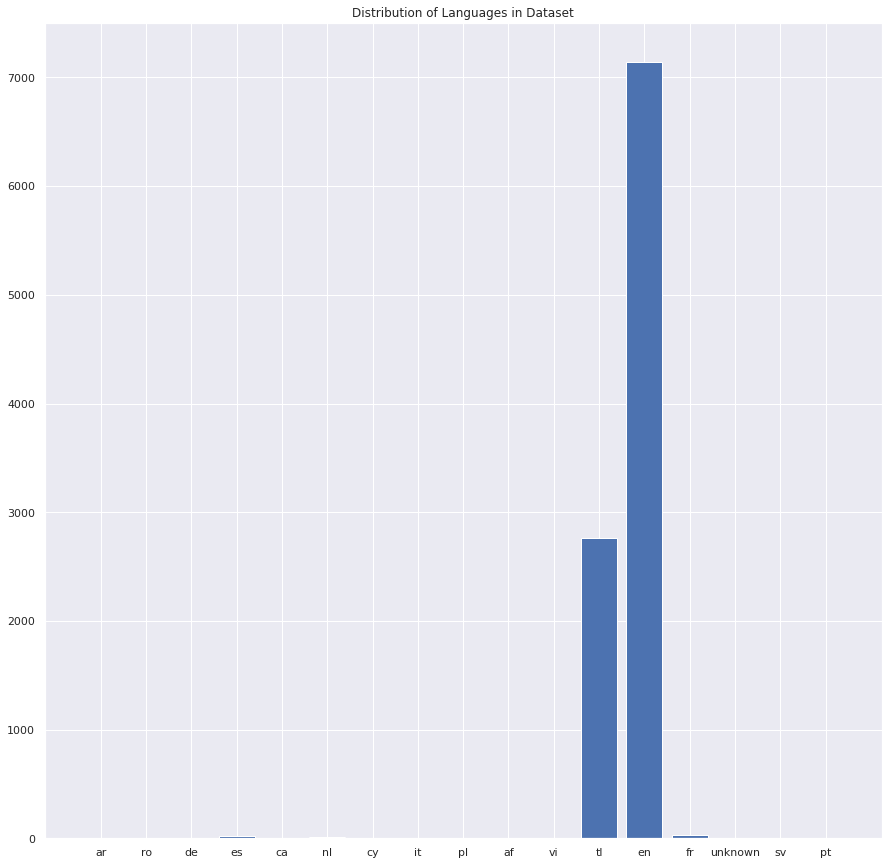

In [0]:
# Filter for articles in "English"

dfTrain_sample['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in Dataset")
plt.show()

In [0]:
dfTrain_sample = dfTrain_sample[dfTrain_sample['language'] == 'en'] 
dfTrain_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7145 entries, 20188 to 23314
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Unnamed: 0             7145 non-null   int64 
 1   paper_id               7145 non-null   object
 2   abstract               7145 non-null   object
 3   full_text              7145 non-null   object
 4   abstract_word_count    7145 non-null   int64 
 5   abstract_unique_words  7145 non-null   int64 
 6   language               7145 non-null   object
dtypes: int64(3), object(4)
memory usage: 446.6+ KB


In [0]:

def textNormalize(rawString):
    """
    Function for text normalization.
    Text normalization includes:
    1. removing web links
    2. converting all letters to lower or upper case
    3. removing punctuationsz
    4. removing numbers
    5. tokenization
    6. removing stopwords
    7. stemming
    8. lemmatization
    Input:
        rawString: a string contains the text to be normaized. 
    Output:
        normText: a string contains the normalized text where the tokens extracted from rawString are joined by space.
    """
    if rawString == np.nan:
        return rawString
    ## Remove web links
    rawString = re.sub('https?://\S+|www\.\S+', '', rawString) 

    ## Lowercase
    rawString = rawString.lower()
    
    ## Remove punctuation
    rawString = re.sub('<.*?>+', ' ', rawString)
    rawString = re.sub('[%s]' % re.escape(string.punctuation), ' ', rawString)
    
    ## Remove number
    rawString = re.sub(r'\d+', '', rawString)
    
    ## Tokenize
    words = word_tokenize(rawString)
    
    ## Remove stop words
    nltk_stop_words = stopwords.words('english')
    words = [word for word in words if word not in nltk_stop_words]
    
    ## Stem
    stemmer = SnowballStemmer('english')
    words = [stemmer.stem(word) for word in words]
    
    ## Lematize verbs
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word, pos='v') for word in words]
    
    normText = " ".join(words)
    
    return normText


startTime = time.time()
df["clean_abstract"] = float("NaN")
df.loc[df["abstract"].notnull(), "clean_abstract"] = \
df["abstract"][df["abstract"].notnull()].apply(lambda x: textNormalize(x))
print("Time spent: " + str(round((time.time() - startTime) / 60, 3)) + "min.")

df.to_csv("Metadata_clean.csv", index = False)

Time spent: 2.559min.


In [0]:
### Utils
from collections import Counter
from sklearn.metrics import silhouette_score
import umap
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel


def get_topic_words(token_lists, labels, k=None):
    """
    get top words within each topic from clustering results
    """
    if k is None:
        k = len(np.unique(labels))
    topics = ['' for _ in range(k)]
    for i, c in enumerate(token_lists):
        topics[labels[i]] += (' ' + ' '.join(c))
    word_counts = list(map(lambda x: Counter(x.split()).items(), topics))
    # get sorted word counts
    word_counts = list(map(lambda x: sorted(x, key=lambda x: x[1], reverse=True), word_counts))
    # get topics
    topics = list(map(lambda x: list(map(lambda x: x[0], x[:10])), word_counts))

    return topics

def get_coherence(model, token_lists, measure='c_v'):
    """
    Get model coherence from gensim.models.coherencemodel
    :param model: Topic_Model object
    :param token_lists: token lists of docs
    :param topics: topics as top words
    :param measure: coherence metrics
    :return: coherence score
    """
    if model.method == 'LDA':
        cm = CoherenceModel(model=model.ldamodel, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    else:
        topics = get_topic_words(token_lists, model.cluster_model.labels_)
        cm = CoherenceModel(topics=topics, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    return cm.get_coherence()

def get_silhouette(model):
    """
    Get silhouette score from model
    :param model: Topic_Model object
    :return: silhouette score
    """
    if model.method == 'LDA':
        return
    lbs = model.cluster_model.labels_
    vec = model.vec[model.method]
    return silhouette_score(vec, lbs)

def plot_proj(embedding, lbs):
    """
    Plot UMAP embeddings
    :param embedding: UMAP (or other) embeddings
    :param lbs: labels
    """
    n = len(embedding)
    counter = Counter(lbs)
    for i in range(len(np.unique(lbs))):
        plt.plot(embedding[:, 0][lbs == i], embedding[:, 1][lbs == i], '.', alpha=0.5,
                 label='cluster {}: {:.2f}%'.format(i, counter[i] / n * 100))
    plt.legend(loc = 'best')
    plt.grid(color ='grey', linestyle='-',linewidth = 0.25)


def visualize(model):
    """
    Visualize the result for the topic model by 2D embedding (UMAP)
    :param model: Topic_Model object
    """
    if model.method == 'LDA':
        return
    reducer = umap.UMAP()
    print('Calculating UMAP projection ...')
    vec_umap = reducer.fit_transform(model.vec[model.method])
    print('Calculating UMAP projection. Done!')
    plot_proj(vec_umap, model.cluster_model.labels_)
    dr = '/content/drive/My Drive/working/contextual_topic_identification/docs/images/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/content/drive/My Drive/working/2D_vis')

def get_wordcloud(model, token_lists, topic):
    """
    Get word cloud of each topic from fitted model
    :param model: Topic_Model object
    :param sentences: preprocessed sentences from docs
    """
    if model.method == 'LDA':
        return
    print('Getting wordcloud for topic {} ...'.format(topic))
    lbs = model.cluster_model.labels_
    tokens = ' '.join([' '.join(_) for _ in np.array(token_lists)[lbs == topic]])

    wordcloud = WordCloud(width=800, height=560,
                          background_color='white', collocations=False,
                          min_font_size=10).generate(tokens)

    # plot the WordCloud image
    plt.figure(figsize=(8, 5.6), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    dr = '/content/drive/My Drive/working/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/content/drive/My Drive/working' + '/Topic' + str(topic) + '_wordcloud')
    print('Getting wordcloud for topic {}. Done!'.format(topic))

#Data Pre-Processing#

###Model Exploration I###

In [0]:
dfTrain['abstract'].describe(include='all')

count     40144
unique    28651
top         nan
freq      10838
Name: abstract, dtype: object

In [0]:
dfTrain.drop_duplicates(['abstract', 'full_text'], inplace=True)
dfTrain['abstract'].describe(include='all')

count     39660
unique    28651
top         nan
freq      10729
Name: abstract, dtype: object

In [0]:
dfTrain['full_text'].describe(include='all')

count                                                 39660
unique                                                39631
top       The majority of individuals who develop acute ...
freq                                                      2
Name: full_text, dtype: object

In [0]:
# Due to memory issues, I used only a sample of 10000 records for my model
dfTrain_sample = dfTrain.sample(10000, random_state=42)


In [0]:
from tqdm import tqdm
from langdetect import detect
from langdetect import DetectorFactory

# set seed
DetectorFactory.seed = 0

# hold label - language
languages = []

# go through each text
for ii in tqdm(range(0,len(dfTrain_sample))):
    # split by space into list, take the first x intex, join with space
    text = dfTrain_sample.iloc[ii]['abstract'].split(" ")
    
    lang = "en"
    try:
        if len(text) > 50:
            lang = detect(" ".join(text[:50]))
        elif len(text) > 0:
            lang = detect(" ".join(text[:len(text)]))
    # ught... beginning of the document was not in a good format
    except Exception as e:
        all_words = set(text)
        try:
            lang = detect(" ".join(all_words))
        # what!! :( let's see if we can find any text in abstract...
        except Exception as e:
            
            try:
                # let's try to label it through the abstract then
                lang = detect(dfTrain_sample.iloc[ii]['abstract_summary'])
            except Exception as e:
                lang = "unknown"
                pass
    
    # get the language    
    languages.append(lang)

100%|██████████| 10000/10000 [00:41<00:00, 242.80it/s]


In [0]:
from pprint import pprint


languages_dict = {}
for lang in set(languages):
    languages_dict[lang] = languages.count(lang)
    
print("Total: {}\n".format(len(languages)))
pprint(languages_dict)

Total: 10000

{'af': 1,
 'ar': 1,
 'ca': 2,
 'cy': 7,
 'de': 5,
 'en': 7145,
 'es': 20,
 'fr': 34,
 'it': 3,
 'nl': 8,
 'pl': 2,
 'pt': 5,
 'ro': 1,
 'sv': 1,
 'tl': 2759,
 'unknown': 5,
 'vi': 1}


###Model Exploration II###

In [0]:

def textNormalize(rawString):
    """
    Function for text normalization.
    Text normalization includes:
    1. removing web links
    2. converting all letters to lower or upper case
    3. removing punctuationsz
    4. removing numbers
    5. tokenization
    6. removing stopwords
    7. stemming
    8. lemmatization
    Input:
        rawString: a string contains the text to be normaized. 
    Output:
        normText: a string contains the normalized text where the tokens extracted from rawString are joined by space.
    """
    if rawString == np.nan:
        return rawString
    ## Remove web links
    rawString = re.sub('https?://\S+|www\.\S+', '', rawString) 

    ## Lowercase
    rawString = rawString.lower()
    
    ## Remove punctuation
    rawString = re.sub('<.*?>+', ' ', rawString)
    rawString = re.sub('[%s]' % re.escape(string.punctuation), ' ', rawString)
    
    ## Remove number
    rawString = re.sub(r'\d+', '', rawString)
    
    ## Tokenize
    words = word_tokenize(rawString)
    
    ## Remove stop words
    nltk_stop_words = stopwords.words('english')
    words = [word for word in words if word not in nltk_stop_words]
    
    ## Stem
    stemmer = SnowballStemmer('english')
    words = [stemmer.stem(word) for word in words]
    
    ## Lematize verbs
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word, pos='v') for word in words]
    
    normText = " ".join(words)
    
    return normText


startTime = time.time()
df["clean_abstract"] = float("NaN")
df.loc[df["abstract"].notnull(), "clean_abstract"] = \
df["abstract"][df["abstract"].notnull()].apply(lambda x: textNormalize(x))
print("Time spent: " + str(round((time.time() - startTime) / 60, 3)) + "min.")

df.to_csv("Metadata_clean.csv", index = False)

Time spent: 2.559min.


In [0]:
### Utils
from collections import Counter
from sklearn.metrics import silhouette_score
import umap
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel


def get_topic_words(token_lists, labels, k=None):
    """
    get top words within each topic from clustering results
    """
    if k is None:
        k = len(np.unique(labels))
    topics = ['' for _ in range(k)]
    for i, c in enumerate(token_lists):
        topics[labels[i]] += (' ' + ' '.join(c))
    word_counts = list(map(lambda x: Counter(x.split()).items(), topics))
    # get sorted word counts
    word_counts = list(map(lambda x: sorted(x, key=lambda x: x[1], reverse=True), word_counts))
    # get topics
    topics = list(map(lambda x: list(map(lambda x: x[0], x[:10])), word_counts))

    return topics

def get_coherence(model, token_lists, measure='c_v'):
    """
    Get model coherence from gensim.models.coherencemodel
    :param model: Topic_Model object
    :param token_lists: token lists of docs
    :param topics: topics as top words
    :param measure: coherence metrics
    :return: coherence score
    """
    if model.method == 'LDA':
        cm = CoherenceModel(model=model.ldamodel, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    else:
        topics = get_topic_words(token_lists, model.cluster_model.labels_)
        cm = CoherenceModel(topics=topics, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    return cm.get_coherence()

def get_silhouette(model):
    """
    Get silhouette score from model
    :param model: Topic_Model object
    :return: silhouette score
    """
    if model.method == 'LDA':
        return
    lbs = model.cluster_model.labels_
    vec = model.vec[model.method]
    return silhouette_score(vec, lbs)

def plot_proj(embedding, lbs):
    """
    Plot UMAP embeddings
    :param embedding: UMAP (or other) embeddings
    :param lbs: labels
    """
    n = len(embedding)
    counter = Counter(lbs)
    for i in range(len(np.unique(lbs))):
        plt.plot(embedding[:, 0][lbs == i], embedding[:, 1][lbs == i], '.', alpha=0.5,
                 label='cluster {}: {:.2f}%'.format(i, counter[i] / n * 100))
    plt.legend(loc = 'best')
    plt.grid(color ='grey', linestyle='-',linewidth = 0.25)


def visualize(model):
    """
    Visualize the result for the topic model by 2D embedding (UMAP)
    :param model: Topic_Model object
    """
    if model.method == 'LDA':
        return
    reducer = umap.UMAP()
    print('Calculating UMAP projection ...')
    vec_umap = reducer.fit_transform(model.vec[model.method])
    print('Calculating UMAP projection. Done!')
    plot_proj(vec_umap, model.cluster_model.labels_)
    dr = '/content/drive/My Drive/working/contextual_topic_identification/docs/images/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/content/drive/My Drive/working/2D_vis')

def get_wordcloud(model, token_lists, topic):
    """
    Get word cloud of each topic from fitted model
    :param model: Topic_Model object
    :param sentences: preprocessed sentences from docs
    """
    if model.method == 'LDA':
        return
    print('Getting wordcloud for topic {} ...'.format(topic))
    lbs = model.cluster_model.labels_
    tokens = ' '.join([' '.join(_) for _ in np.array(token_lists)[lbs == topic]])

    wordcloud = WordCloud(width=800, height=560,
                          background_color='white', collocations=False,
                          min_font_size=10).generate(tokens)

    # plot the WordCloud image
    plt.figure(figsize=(8, 5.6), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    dr = '/content/drive/My Drive/working/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/content/drive/My Drive/working' + '/Topic' + str(topic) + '_wordcloud')
    print('Getting wordcloud for topic {}. Done!'.format(topic))

**Full Data Pre-Processing**

In [0]:
### Preprocessing 

from stop_words import get_stop_words
from nltk.stem.porter import PorterStemmer
import nltk
from nltk.tokenize import word_tokenize
from language_detector import detect_language

import pkg_resources
from symspellpy import SymSpell, Verbosity

sym_spell = SymSpell(max_dictionary_edit_distance=3, prefix_length=7)
dictionary_path = pkg_resources.resource_filename(
    "symspellpy", "frequency_dictionary_en_82_765.txt")
if sym_spell.word_count:
    pass
else:
    sym_spell.load_dictionary(dictionary_path, term_index=0, count_index=1)

###################################
#### sentence level preprocess ####
###################################

# lowercase + base filter, some basic normalization
def f_base(s):
    """
    :param s: string to be processed
    :return: processed string: see comments in the source code for more info
    """
    # normalization 1: xxxThis is a --> xxx. This is a (missing delimiter)
    s = re.sub(r'([a-z])([A-Z])', r'\1\. \2', s)  # before lower case
    # normalization 2: lower case
    s = s.lower()
    # normalization 3: "&gt", "&lt"
    s = re.sub(r'&gt|&lt', ' ', s)
    # normalization 4: letter repetition (if more than 2)
    s = re.sub(r'([a-z])\1{2,}', r'\1', s)
    # normalization 5: non-word repetition (if more than 1)
    s = re.sub(r'([\W+])\1{1,}', r'\1', s)
    # normalization 6: string * as delimiter
    s = re.sub(r'\*|\W\*|\*\W', '. ', s)
    # normalization 7: stuff in parenthesis, assumed to be less informal
    s = re.sub(r'\(.*?\)', '. ', s)
    # normalization 8: xxx[?!]. -- > xxx.
    s = re.sub(r'\W+?\.', '.', s)
    # normalization 9: [.?!] --> [.?!] xxx
    s = re.sub(r'(\.|\?|!)(\w)', r'\1 \2', s)
    # normalization 10: ' ing ', noise text
    s = re.sub(r' ing ', ' ', s)
    # normalization 11: noise text
    s = re.sub(r'product received for free[.| ]', ' ', s)
    # normalization 12: phrase repetition
    s = re.sub(r'(.{2,}?)\1{1,}', r'\1', s)

    return s.strip()


# language detection
def f_lan(s):
    """
    :param s: string to be processed
    :return: boolean (s is English)
    """
    
    # some reviews are actually english but biased toward french
    return detect_language(s) in {'English', 'French','Spanish','Chinese'}


###############################
#### word level preprocess ####
###############################

# filtering out punctuations and numbers
def f_punct(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with punct and number filter out
    """
    return [word for word in w_list if word.isalpha()]


# selecting nouns
def f_noun(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with only nouns selected
    """
    return [word for (word, pos) in nltk.pos_tag(w_list) if pos[:2] == 'NN']


# typo correction
def f_typo(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with typo fixed by symspell. words with no match up will be dropped
    """
    w_list_fixed = []
    for word in w_list:
        suggestions = sym_spell.lookup(word, Verbosity.CLOSEST, max_edit_distance=3)
        if suggestions:
            w_list_fixed.append(suggestions[0].term)
        else:
            pass
            # do word segmentation, deprecated for inefficiency
            # w_seg = sym_spell.word_segmentation(phrase=word)
            # w_list_fixed.extend(w_seg.corrected_string.split())
    return w_list_fixed


# stemming if doing word-wise
p_stemmer = PorterStemmer()


def f_stem(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with stemming
    """
    return [p_stemmer.stem(word) for word in w_list]


# filtering out stop words
# create English stop words list

stop_words = (list(
    set(get_stop_words('en'))
    |set(get_stop_words('es'))
    |set(get_stop_words('de'))
    |set(get_stop_words('it'))
    |set(get_stop_words('ca'))
    #|set(get_stop_words('cy'))
    |set(get_stop_words('pt'))
    #|set(get_stop_words('tl'))
    |set(get_stop_words('pl'))
    #|set(get_stop_words('et'))
    |set(get_stop_words('da'))
    |set(get_stop_words('ru'))
    #|set(get_stop_words('so'))
    |set(get_stop_words('sv'))
    |set(get_stop_words('sk'))
    #|set(get_stop_words('cs'))
    |set(get_stop_words('nl'))
    #|set(get_stop_words('sl'))
    #|set(get_stop_words('no'))
    #|set(get_stop_words('zh-cn'))
))




def f_stopw(w_list):
    """
    filtering out stop words
    """
    return [word for word in w_list if word not in stop_words]


def preprocess_sent(rw):
    """
    Get sentence level preprocessed data from raw review texts
    :param rw: review to be processed
    :return: sentence level pre-processed review
    """
    s = f_base(rw)
    if not f_lan(s):
        return None
    return s


def preprocess_word(s):
    """
    Get word level preprocessed data from preprocessed sentences
    including: remove punctuation, select noun, fix typo, stem, stop_words
    :param s: sentence to be processed
    :return: word level pre-processed review
    """
    if not s:
        return None
    w_list = word_tokenize(s)
    w_list = f_punct(w_list)
    w_list = f_noun(w_list)
    w_list = f_typo(w_list)
    w_list = f_stem(w_list)
    w_list = f_stopw(w_list)

    return w_list

**Autoencoder**

In [0]:
### Autoencoder
import keras
from keras.layers import Input, Dense
from keras.models import Model
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


class Autoencoder:
    """
    Autoencoder for learning latent space representation
    architecture simplified for only one hidden layer
    """

    def __init__(self, latent_dim=32, activation='relu', epochs=200, batch_size=128):
        self.latent_dim = latent_dim
        self.activation = activation
        self.epochs = epochs
        self.batch_size = batch_size
        self.autoencoder = None
        self.encoder = None
        self.decoder = None
        self.his = None

    def _compile(self, input_dim):
        """
        compile the computational graph
        """
        input_vec = Input(shape=(input_dim,))
        encoded = Dense(self.latent_dim, activation=self.activation)(input_vec)
        decoded = Dense(input_dim, activation=self.activation)(encoded)
        self.autoencoder = Model(input_vec, decoded)
        self.encoder = Model(input_vec, encoded)
        encoded_input = Input(shape=(self.latent_dim,))
        decoder_layer = self.autoencoder.layers[-1]
        self.decoder = Model(encoded_input, self.autoencoder.layers[-1](encoded_input))
        self.autoencoder.compile(optimizer='adam', loss=keras.losses.mean_squared_error)

    def fit(self, X):
        if not self.autoencoder:
            self._compile(X.shape[1])
        X_train, X_test = train_test_split(X)
        self.his = self.autoencoder.fit(X_train, X_train,
                                        epochs=200,
                                        batch_size=128,
                                        shuffle=True,
                                        validation_data=(X_test, X_test), verbose=0)

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from gensim import corpora
import gensim
#from Autoencoder import *
#from preprocess import *
from datetime import datetime


def preprocess(docs, samp_size=None):
    """
    Preprocess the data
    """
    if not samp_size:
        samp_size = 100

    print('Preprocessing raw texts ...')
    n_docs = len(docs)
    sentences = []  # sentence level preprocessed
    token_lists = []  # word level preprocessed
    idx_in = []  # index of sample selected
    #     samp = list(range(100))
    samp = np.random.choice(n_docs, samp_size)
    for i, idx in enumerate(samp):
        sentence = preprocess_sent(docs[idx])
        token_list = preprocess_word(sentence)
        if token_list:
            idx_in.append(idx)
            sentences.append(sentence)
            token_lists.append(token_list)
        print('{} %'.format(str(np.round((i + 1) / len(samp) * 100, 2))), end='\r')
    print('Preprocessing raw texts. Done!')
    return sentences, token_lists, idx_in

#Model Building#

###Model Exploration I###

We wanted to explore different models and hence took a sample of 10000 records
from the published articles.  We built a Tfidf vector with 4096 (2 ** 12) feature matrix.  Performed PCA analysis to only get the most uncorrelated features which resulted in 2532 features. 


**Data Model : TfidfVectorizer**

In [0]:

from sklearn.feature_extraction.text import TfidfVectorizer
def vectorize(text, maxx_features):
    '''
    Function to vetorize the dataset will return the vectors 
    the text
    '''    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [0]:
#Assign to text variable
text = dfTrain_sample['processed_text'].values
X = vectorize(text, 2 ** 12)
X.shape

(7145, 4096)

In [0]:
from sklearn.decomposition import PCA
#Perform PCA Analysis
pca = PCA(n_components=0.95, random_state=42)
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(7145, 2532)

In [0]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

# run kmeans with many different k
distortions = []
K = range(2,50,2)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
    k_means.fit(X_reduced)
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])
    #print('Found distortion for {} clusters'.format(k))

Performed a K-Mean Clustering Algorithm to identify the relevant clusters in the corpus. After running the Clustering Algorithm, I noticed, the optimal clusters for this dataset was 18 using the elbow curve(The elbow curve is shown below) 

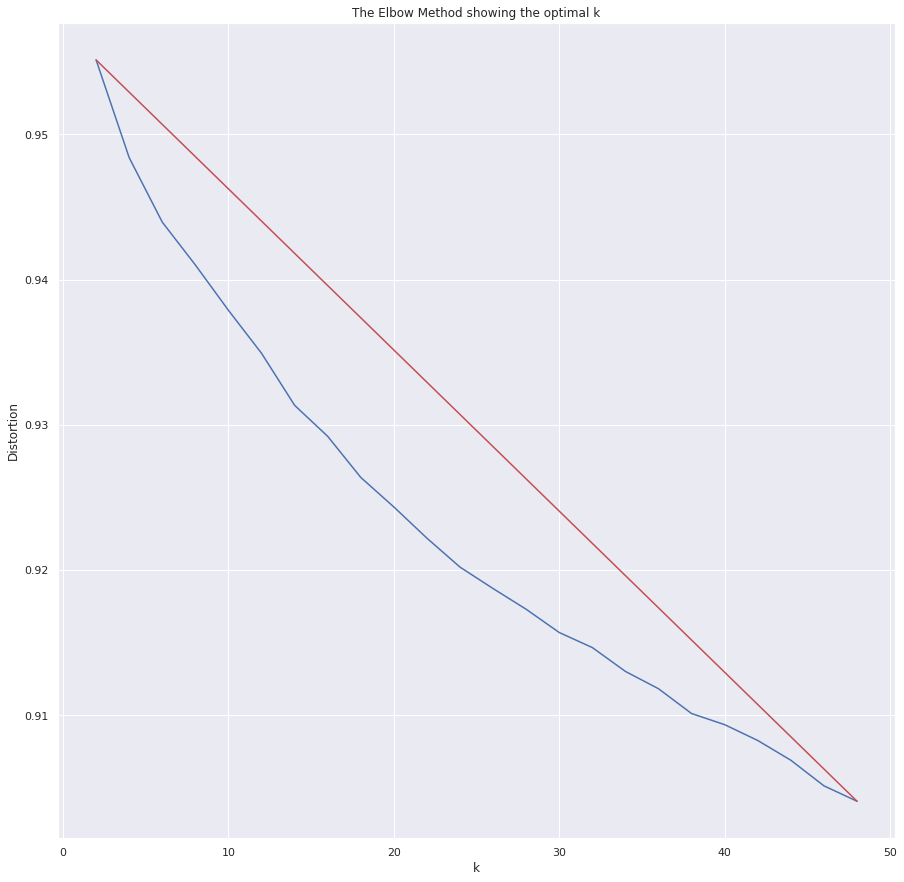

In [0]:
X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [0]:
#From the elbow curve identified the optimal number of clusters in 18
k = 18
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)

#attaching the results to the dataframe
dfTrain_sample['y'] = y_pred

In [0]:
from sklearn.manifold import TSNE
#creating TSNE probabilities
tsne = TSNE(verbose=1, perplexity=100, random_state=42)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 7145 samples in 5.357s...
[t-SNE] Computed neighbors for 7145 samples in 443.890s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7145
[t-SNE] Computed conditional probabilities for sample 2000 / 7145
[t-SNE] Computed conditional probabilities for sample 3000 / 7145
[t-SNE] Computed conditional probabilities for sample 4000 / 7145
[t-SNE] Computed conditional probabilities for sample 5000 / 7145
[t-SNE] Computed conditional probabilities for sample 6000 / 7145
[t-SNE] Computed conditional probabilities for sample 7000 / 7145
[t-SNE] Computed conditional probabilities for sample 7145 / 7145
[t-SNE] Mean sigma: 0.408841
[t-SNE] KL divergence after 250 iterations with early exaggeration: 112.040321
[t-SNE] KL divergence after 1000 iterations: 2.902996


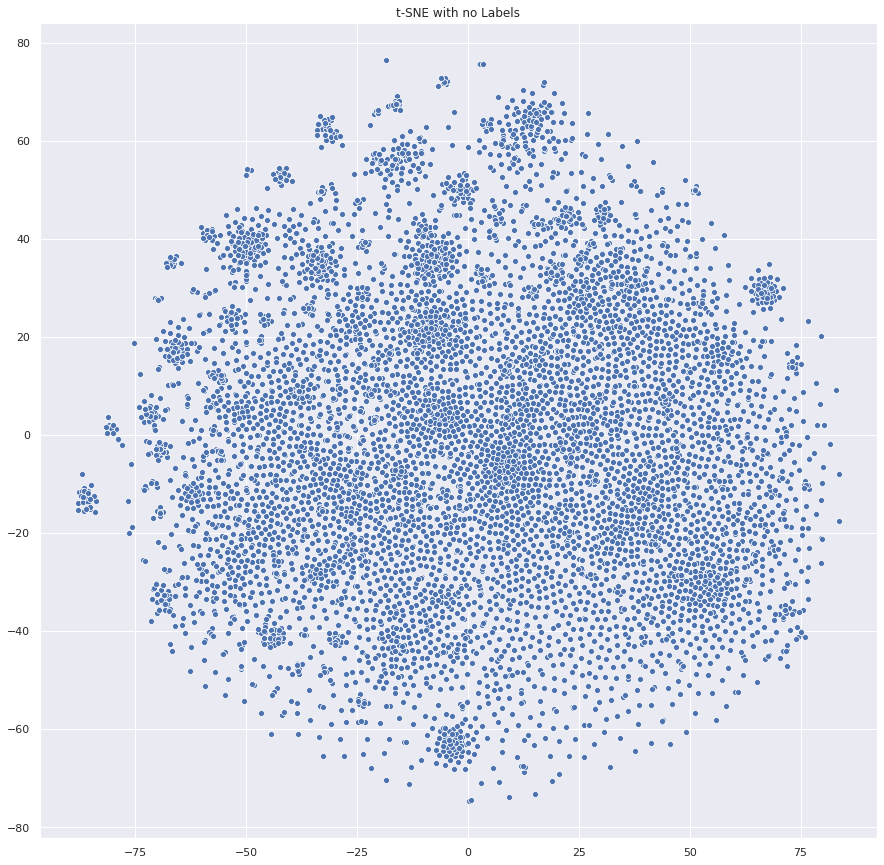

In [0]:
from matplotlib import pyplot as plt
import seaborn as sns
#plotting the results
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)
plt.title('t-SNE with no Labels')
plt.savefig("t-sne_covid19.png")
plt.show()

Created a t-SNE plot to visualize the clusters. It can be clearly seen that the various colors indicates different clusters. We wanted to check what are the top keywords for each cluster and also, how well the Clustering algorithm performed. So we used a Supervised Machine Learning Algorithm on top of the Clustering Algorithm to identify its performance and accuracy, which is detailed in the next sections. 

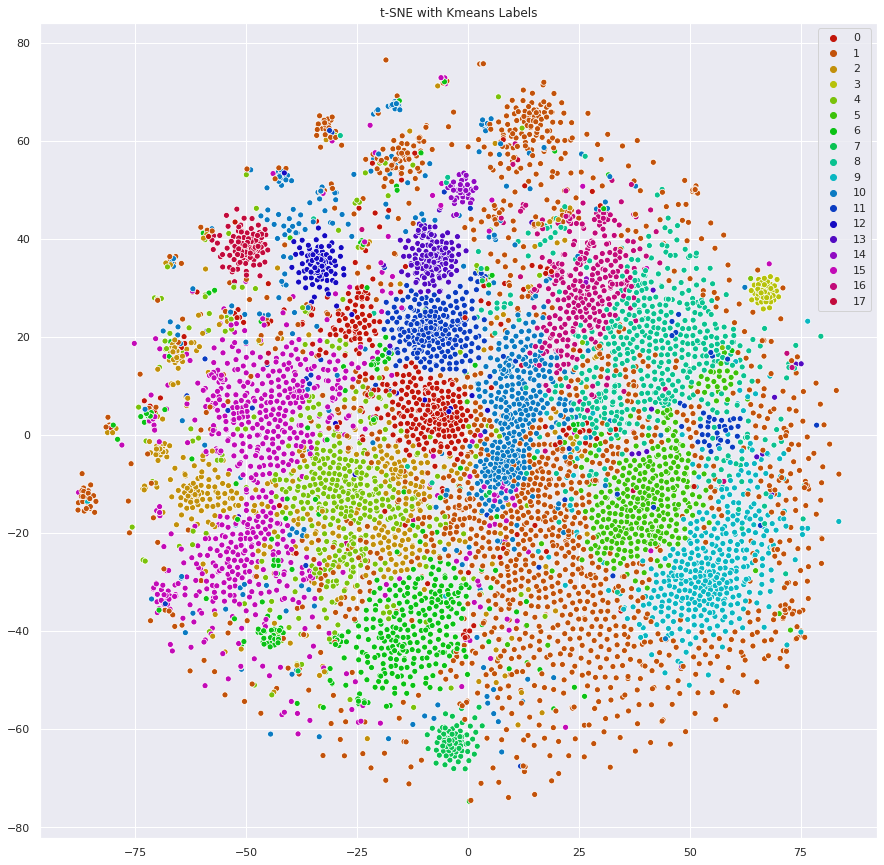

In [0]:
from matplotlib import pyplot as plt
import seaborn as sns
#plotting the data on a color pallete
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.hls_palette(18, l=.4, s=.9)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

**Data Model 2: CountVectorizer**

The intention of the below analysis is to identify the relevant Topics using LDA and obtain the top Key words in few categories

In [0]:
#import pacckages related to LDA
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [0]:
vectorizers = []
    
for ii in range(0, 20):
    # Creating a vectorizer
    vectorizers.append(CountVectorizer(min_df=5, max_df=0.9, stop_words='english', lowercase=True, token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}'))

In [0]:
vectorized_data = []
#get the data for the vetroizers
for current_cluster, cvec in enumerate(vectorizers):
    try:
        vectorized_data.append(cvec.fit_transform(dfTrain_sample.loc[dfTrain_sample['y'] == current_cluster, 'processed_text']))
    except Exception as e:
        print("Not enough instances in cluster: " + str(current_cluster))
        vectorized_data.append(None)

Not enough instances in cluster: 18
Not enough instances in cluster: 19


In [0]:
len(vectorized_data)

20

In [0]:
# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = 20

#Create LDA Model
lda_models = []
for ii in range(0, 20):
    # Latent Dirichlet Allocation Model
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)
    lda_models.append(lda)
    
lda_models[0]

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=20, n_jobs=None,
                          perp_tol=0.1, random_state=42, topic_word_prior=None,
                          total_samples=1000000.0, verbose=False)

In [0]:
clusters_lda_data = []

#obtain vectorized data
for current_cluster, lda in enumerate(lda_models):    
    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))

In [0]:
#function to return relevant topics
def selected_topics(model, vectorizer, top_n=3):
    current_words = []
    keywords = []
    
    for idx, topic in enumerate(model.components_):
        words = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        for word in words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.append(word[0])
                
    keywords.sort(key = lambda x: x[1])  
    keywords.reverse()
    return_values = []
    for ii in keywords:
        return_values.append(ii[0])
    return return_values

In [0]:
#Extract the top keywords from the clusters
all_keywords = []
for current_vectorizer, lda in enumerate(lda_models):
    # print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None:
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))

In [0]:
#Display top keywords from cluster 0
all_keywords[0][:10]

['antibody',
 'response',
 'infection',
 'development',
 'disease',
 'protein',
 'influenza',
 'antigen',
 'peptide',
 'pandemic']

In [0]:
len(all_keywords)

18

In [0]:
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

In [0]:
# save the COVID-19 DataFrame, too large for github
pickle.dump(dfTrain_sample, open("df_covid_0429.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded_0429.p", "wb" ))

# save the labels generate with k-means(20)
pickle.dump(y_pred, open("y_pred_0429.p", "wb" ))

Using Scikit-learn utilize Supervised Machine Learning Algorithm to identify if the clusters obtained have a pattern and if their prediction indeed is accurate. So, we tested Stochastic Gradient classifer as this is a basic classifer to understand if there is a linear pattern in the dataset.

Results on the SGD proved to be promising with a linear classifier we obtained the Accuracy Score: 90.7% and F1 Score: 88.5%

We also calculated the Rand Index to evaluate the Cluster Performance. The Rand Index score: 0.87

In [0]:
# function to print out classification model report
def classification_report_new(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Sample Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Sample Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='macro')) * 100), "%")
    print("        Sample Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='macro')) * 100), "%")
    print("      Sample F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='macro')) * 100), "%")

In [0]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test, y_train, y_test = train_test_split(X.toarray(),y_pred, test_size=0.2, random_state=42)

print("X_train Sample size:", len(X_train))
print("X_test Sample size:", len(X_test), "\n")

X_train Sample size: 8000
X_test Sample size: 2000 



In [0]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import SGDClassifier

# SGD instance
sgd_clf_new = SGDClassifier(max_iter=10000, tol=1e-3, random_state=42, n_jobs=4)
# train SGD
sgd_clf_new.fit(X_train, y_train)

# cross validation predictions
sgd_pred_new = cross_val_predict(sgd_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the classification report
classification_report_new("SGD on Training Set", y_train, sgd_pred)

SGD on Training Set :

Sample Accuracy Score:  90.700 %
     Sample Precision:  90.854 %
        Sample Recall:  87.849 %
      Sample F1 score:  89.178 %


In [0]:
# cross validation predictions
sgd_pred_test = cross_val_predict(sgd_clf, X_test, y_test, cv=3, n_jobs=4)

# print out the classification report
classification_report_new("SGD on Test Set", y_test, sgd_pred_test)

SGD on Test Set :

Sample Accuracy Score:  85.050 %
     Sample Precision:  84.965 %
        Sample Recall:  82.094 %
      Sample F1 score:  83.352 %


In [0]:
# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_test, y_test, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (TrainTeing Set)", y_test, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  80.056 %
     Precision:  86.152 %
        Recall:  80.552 %
      F1 score:  82.610 %


In [0]:
sgd_cv_score = cross_val_score(sgd_clf_new, X.toarray(), y_pred, cv=10)
print("Mean cv Score - SGD: {:,.3f}".format(float(sgd_cv_score.mean()) * 100), "%")

Mean cv Score - SGD: 92.000 %


In [0]:
import numpy as np
from sklearn import metrics

def purity_score(y_true, y_pred):
    # compute contingency matrix (also called confusion matrix)
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
    # return purity
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix) 

In [0]:
contingency_matrix = metrics.cluster.contingency_matrix(y_train, sgd_pred)
print("Purity Score:",np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix))
print("Rand Index Score:",metrics.adjusted_rand_score(y_train,sgd_pred))

Purity Score: 0.907
Rand Index Score: 0.870265675587904


###Model Exploration II###

In [0]:



# define model object
class Topic_Model:
    def __init__(self, k=10, method='TFIDF'):
        """
        :param k: number of topics
        :param method: method chosen for the topic model
        """
        if method not in {'TFIDF', 'LDA', 'BERT', 'LDA_BERT'}:
            raise Exception('Invalid method!')
        self.k = k
        self.dictionary = None
        self.corpus = None
        #         self.stopwords = None
        self.cluster_model = None
        self.ldamodel = None
        self.vec = {}
        self.gamma = 15  # parameter for reletive importance of lda
        self.method = method
        self.AE = None
        self.id = method + '_' + datetime.now().strftime("%Y_%m_%d_%H_%M_%S")

    def vectorize(self, sentences, token_lists, method=None):
        """
        Get vecotr representations from selected methods
        """
        # Default method
        if method is None:
            method = self.method

        # turn tokenized documents into a id <-> term dictionary
        self.dictionary = corpora.Dictionary(token_lists)
        # convert tokenized documents into a document-term matrix
        self.corpus = [self.dictionary.doc2bow(text) for text in token_lists]

        if method == 'TFIDF':
            print('Getting vector representations for TF-IDF ...')
            tfidf = TfidfVectorizer()
            vec = tfidf.fit_transform(sentences)
            print('Getting vector representations for TF-IDF. Done!')
            return vec

        elif method == 'LDA':
            print('Getting vector representations for LDA ...')
            if not self.ldamodel:
                self.ldamodel = gensim.models.ldamodel.LdaModel(self.corpus, num_topics=self.k, id2word=self.dictionary,
                                                                passes=20)

            def get_vec_lda(model, corpus, k):
                """
                Get the LDA vector representation (probabilistic topic assignments for all documents)
                :return: vec_lda with dimension: (n_doc * n_topic)
                """
                n_doc = len(corpus)
                vec_lda = np.zeros((n_doc, k))
                for i in range(n_doc):
                    # get the distribution for the i-th document in corpus
                    for topic, prob in model.get_document_topics(corpus[i]):
                        vec_lda[i, topic] = prob

                return vec_lda

            vec = get_vec_lda(self.ldamodel, self.corpus, self.k)
            print('Getting vector representations for LDA. Done!')
            return vec

        elif method == 'BERT':

            print('Getting vector representations for BERT ...')
            from sentence_transformers import SentenceTransformer
            model = SentenceTransformer('bert-base-nli-max-tokens')
            vec = np.array(model.encode(sentences, show_progress_bar=True))
            print('Getting vector representations for BERT. Done!')
            return vec

             
        elif method == 'LDA_BERT':
        #else:
            vec_lda = self.vectorize(sentences, token_lists, method='LDA')
            vec_bert = self.vectorize(sentences, token_lists, method='BERT')
            vec_ldabert = np.c_[vec_lda * self.gamma, vec_bert]
            self.vec['LDA_BERT_FULL'] = vec_ldabert
            if not self.AE:
                self.AE = Autoencoder()
                print('Fitting Autoencoder ...')
                self.AE.fit(vec_ldabert)
                print('Fitting Autoencoder Done!')
            vec = self.AE.encoder.predict(vec_ldabert)
            return vec

    def fit(self, sentences, token_lists, method=None, m_clustering=None):
        """
        Fit the topic model for selected method given the preprocessed data
        :docs: list of documents, each doc is preprocessed as tokens
        :return:
        """
        # Default method
        if method is None:
            method = self.method
        # Default clustering method
        if m_clustering is None:
            m_clustering = KMeans

        # turn tokenized documents into a id <-> term dictionary
        if not self.dictionary:
            self.dictionary = corpora.Dictionary(token_lists)
            # convert tokenized documents into a document-term matrix
            self.corpus = [self.dictionary.doc2bow(text) for text in token_lists]

        ####################################################
        #### Getting ldamodel or vector representations ####
        ####################################################

        if method == 'LDA':
            if not self.ldamodel:
                print('Fitting LDA ...')
                self.ldamodel = gensim.models.ldamodel.LdaModel(self.corpus, num_topics=self.k, id2word=self.dictionary,
                                                                passes=20)
                print('Fitting LDA Done!')
        else:
            print('Clustering embeddings ...')
            self.cluster_model = m_clustering(self.k)
            self.vec[method] = self.vectorize(sentences, token_lists, method)
            self.cluster_model.fit(self.vec[method])
            print('Clustering embeddings. Done!')

    def predict(self, sentences, token_lists, out_of_sample=None):
        """
        Predict topics for new_documents
        """
        # Default as False
        out_of_sample = out_of_sample is not None

        if out_of_sample:
            corpus = [self.dictionary.doc2bow(text) for text in token_lists]
            if self.method != 'LDA':
                vec = self.vectorize(sentences, token_lists)
                print(vec)
        else:
            corpus = self.corpus
            vec = self.vec.get(self.method, None)

        if self.method == "LDA":
            lbs = np.array(list(map(lambda x: sorted(self.ldamodel.get_document_topics(x),
                                                     key=lambda x: x[1], reverse=True)[0][0],
                                    corpus)))
        else:
            lbs = self.cluster_model.predict(vec)
        return lbs

**Model Training**

Preprocessing raw texts ...
Preprocessing raw texts. Done!
Clustering embeddings ...
Getting vector representations for BERT ...


Batches: 100%|██████████| 4551/4551 [1:54:09<00:00,  1.50s/it]


Getting vector representations for BERT. Done!
Clustering embeddings. Done!
Coherence: 0.528358603002312
Silhouette Score: 0.034774836
Calculating UMAP projection ...
Calculating UMAP projection. Done!
Getting wordcloud for topic 0 ...
Getting wordcloud for topic 0. Done!
Getting wordcloud for topic 1 ...
Getting wordcloud for topic 1. Done!
Getting wordcloud for topic 2 ...
Getting wordcloud for topic 2. Done!
Getting wordcloud for topic 3 ...
Getting wordcloud for topic 3. Done!
Getting wordcloud for topic 4 ...
Getting wordcloud for topic 4. Done!
Getting wordcloud for topic 5 ...
Getting wordcloud for topic 5. Done!
Getting wordcloud for topic 6 ...
Getting wordcloud for topic 6. Done!
Getting wordcloud for topic 7 ...
Getting wordcloud for topic 7. Done!
Getting wordcloud for topic 8 ...
Getting wordcloud for topic 8. Done!
Getting wordcloud for topic 9 ...
Getting wordcloud for topic 9. Done!
Getting wordcloud for topic 10 ...
Getting wordcloud for topic 10. Done!
Getting wordclo

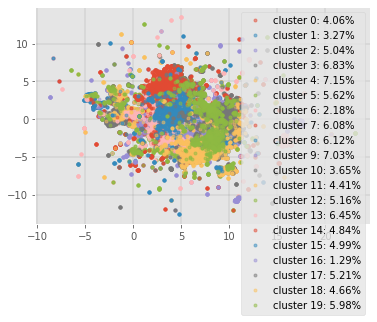

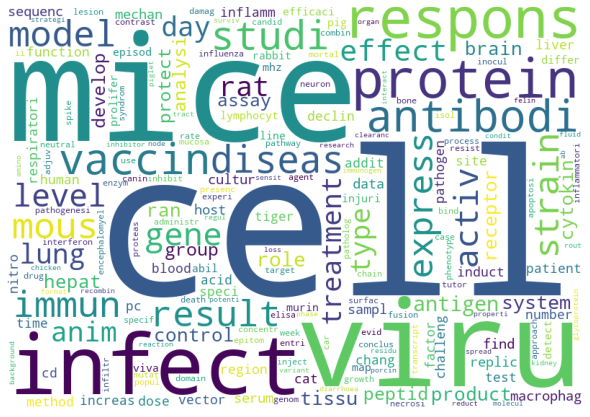

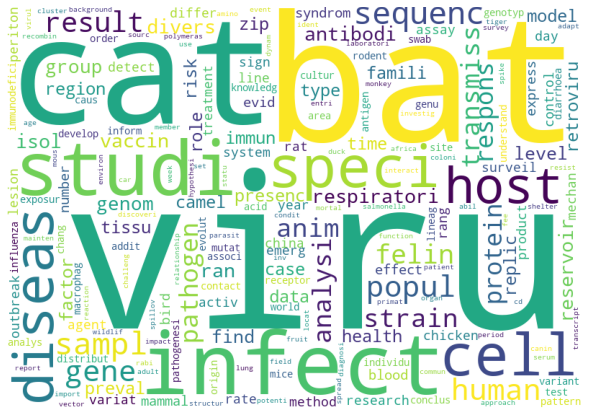

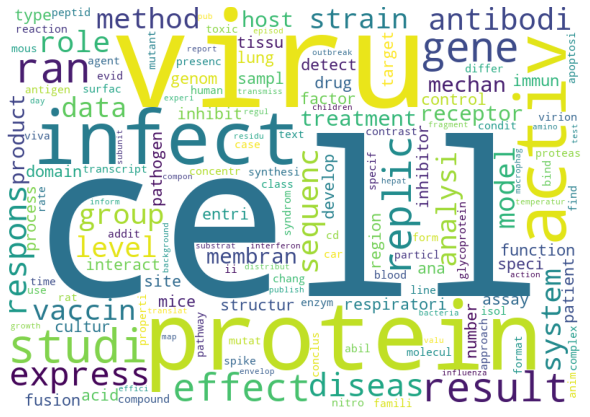

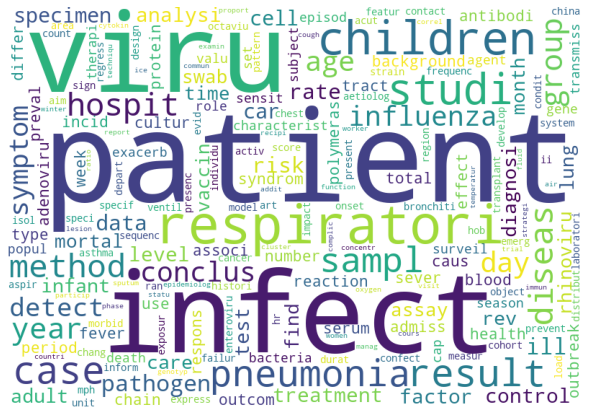

...

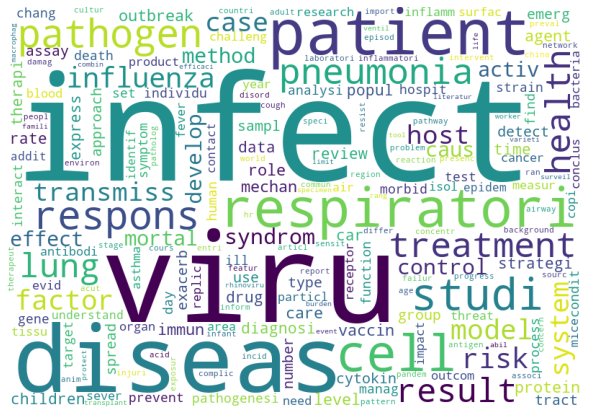

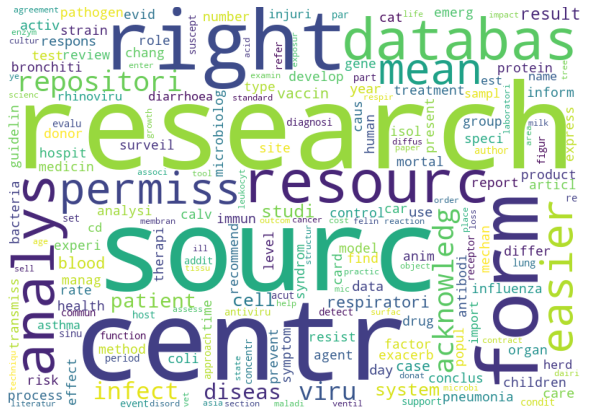

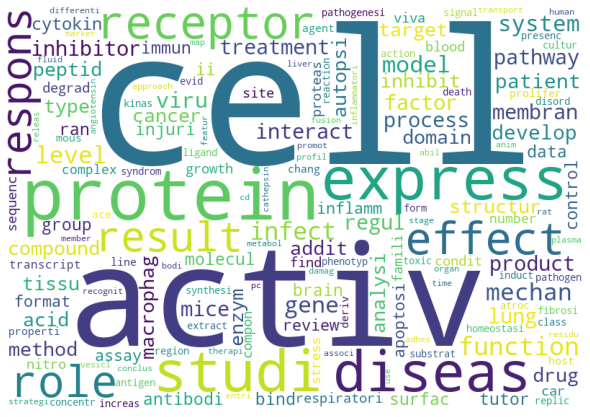

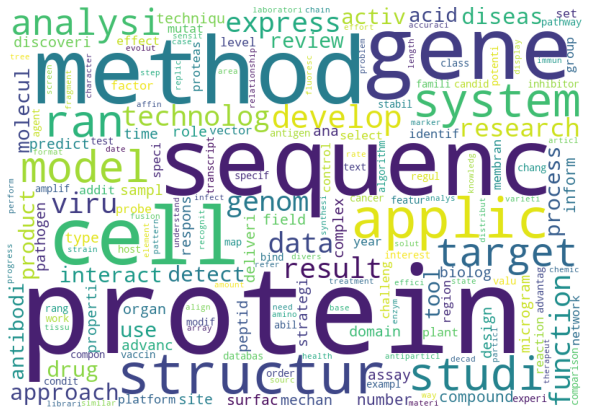

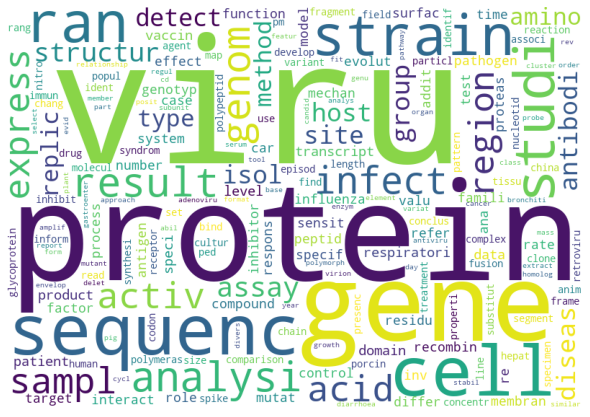

In [0]:
### Training
#from model import *
#from utils import *
import pickle
import argparse
warnings.filterwarnings('ignore', category=Warning)  # import warnings


def main():  #def model(): #:if __name__ == '__main__':  
    
    method = "BERT"
    samp_size = 50000
    ntopic = 20
    
    #parser = argparse.ArgumentParser(description='contextual_topic_identification tm_test:1.0')
    #parser.add_argument('--fpath', default='/content/drive/My Drive/working/train.csv')
    #parser.add_argument('--ntopic', default=10,)
    #parser.add_argument('--method', default='TFIDF')
    #parser.add_argument('--samp_size', default=20500)
    
    #args = parser.parse_args()

    data = pd.read_csv('/content/drive/My Drive/train.csv')
    data = data.fillna('')  # only the comments has NaN's
    rws = data.abstract
    sentences, token_lists, idx_in = preprocess(rws, samp_size=samp_size)
    # Define the topic model object
    #tm = Topic_Model(k = 10), method = TFIDF)
    tm = Topic_Model(k = ntopic, method = method)
    # Fit the topic model by chosen method
    tm.fit(sentences, token_lists)
    # Evaluate using metrics
    with open("/content/drive/My Drive/working/{}.file".format(tm.id), "wb") as f:
        pickle.dump(tm, f, pickle.HIGHEST_PROTOCOL)

    print('Coherence:', get_coherence(tm, token_lists, 'c_v'))
    print('Silhouette Score:', get_silhouette(tm))
    # visualize and save img
    visualize(tm)
    for i in range(tm.k):
        get_wordcloud(tm, token_lists, i)

    
main()  # the model training now need to take more than 6 hours

#Model Evaluation#

#Conclusion#

**Conclusion**

In this study, in the initial model exploration we have attempted to cluster provided literature on COVID-19 and reduce dimensionality of the dataset for clustering and visualization purposes. We obtained a scatter plot of papers related to COVID-19, in which material of similar theme is grouped together. Grouping the literature in this way allows for professionals to quickly find material related to a central topic. Instead of having to manually search for related work, every publication is connected to a larger topic cluster. The clustering of the data was done through k-means on a pre-processed, vectorized version of the literature’s body text. As k-means simply split the data into clusters, topic modeling through LDA was performed to identify keywords. This gave the topics that were prevalent in each of the clusters. Both the clusters and keywords are found through unsupervised learning models and can be useful in revealing patterns that humans may not have even thought about. In no part of this project did we have to manually organize the papers.
K-means and t-SNE were able to independently find clusters, showing that relationships between papers can be identified and measured. Papers written on highly similar topics are typically closer to each other on the plot and carry the same k-means label. However, due to the complexity of the dataset, k-means and t-SNE will sometimes arrive at different decisions. The topics of much of the given literature are continuous and will not have a definite decision boundary. This means that k-means and t-SNE can find different similarities to group the papers.

In the deeper model exploration, we used LDA for probabilistic topic assignment vector and Bert for generating sentence embedding vector. Then we proceeded on to concatenate both LDA and Bert vectors with a weight to balance the relative importance of information from each source. Used autoencoder to learn a lower dimensional latent space representation of the concatenated vector and used clustering on the latent space representations to get topics. The contextual topics that were observed from resulting groupings were pretty significant although there were overlaps. The groupings did identify treatment methods, genetics of the virus, symptoms and prognosis and the potential risk factors. The groupings can be further explored using an interactive method to identify articles related to a specific risk factor(s) and do further research.
The methods that we explored were unsupervised learning methods, the evaluation of our work is not accurate science. The plots were examined to observe that clusters were actually being formed. After that, we examined the content of some of the papers in clusters and examined if similar research areas were clustered. The evaluation methods that we followed gave us a fair understanding on the purity of our groupings, coherence and other statistical metrics.
We did not do a lot of manual investigation of the articles associated with the cluster because we are not qualified to interpret the content of the articles. Even so, it was obvious that articles on key topics could be found in close association to each other. We believe that interested parties can use this exploration to find real association in the textual data. By organizing the articles, people who are qualified can quickly find related articles that answer specific questions related to risk factors for the disease. This study can further be improved by exploring other data analysis techniques and also create an interactive visualization for people to able to search for relevant articles exploring various risk factors associated with the disease

